In [1]:
# Necessary to display the plots in the notebook
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
from ydata_profiling import ProfileReport
from IPython.display import display, display_html, display_markdown, HTML, Markdown as md
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.lines import Line2D
import math
from scipy import stats
import pickle
from joblib import dump
import time
from typing import Union

from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.model_selection import KFold,GridSearchCV, train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline, Pipeline

In [ ]:
%%html
<style>
@import url('https://fonts.googleapis.com/css2?family=DM+Sans:ital,opsz,wght@0,9..40,100..1000;1,9..40,100..1000&display=swap');
div.text_cell {font-family : DM Sans, sans-serif !important;}
pre {font-family : DM Sans, sans-serif !important;}
</style>

# **Regression Model Comparison Template** 
This Notebook compares the performance of different types of regression models on a dataset provided by the user. It assists in the model selection process by helping users discern the most suitible regression model for their dataset. Throughout the template there are sections the user must configure to match characteristics of their dataset. These sections are preceeded by tripple quote comments that inform users when their input is necessary and direct them on how to proceed. Users should store data in the data directory. The load_data function automatically prepends /data to the given file name.
## **Regression Analysis**
Regression refers to statistical methods for analyzing the relationship between dependent and independent variables. In machine learning, regression analysis is implimented as supervised learning algorithms used to identify the relationships between dependent variables called targets and predictive independent variables called features. 

In this example, the regression models are evaluated on a kaggle dataset that contains 10 columns which describe characteristics of diamonds, such as their cut, color, clarity, and dimensions. The target variable is the price of the diamond.

## **Load in a Dataset and Select Columns to Drop**

In [16]:
"""
In the data_file_name variable, input the name of the file containing your dataset (excluding /data. Example input: data_file.csv).

In the columns_to_drop variable, input the name of columns to drop from you dataset (columns that dont contain any useful information for regression).

In the dataset_na_value_representations variable, input all representations of missing values in your dataset that may not be automatically
recognized as missing. Make sure no valid value in your dataset is included in this list.
"""
data_file_name: str = "regression_diamond_data.csv" 
columns_to_drop: list[str] = ["id"] 
dataset_na_value_representations = ['', 'NA', 'N/A', 'null', 'NULL', 'NaN', 'none', 'None', '-', '?']


def display_dataframe(df: pd.DataFrame, font_size: int = 20) -> None:
    """
    Displays the passed in DataFrame with the specified font size.

    Args:
        df (pd.DataFrame): The DataFrame to be displayed.
        font_size (int): The font size at which the DataFrame should be displayed.

    Returns:
        None
    """
    df_html = df.to_html()
    styled_html = f'<div style="font-size: {font_size}px;">{df_html}</div>'
    display_html(HTML(styled_html))
    

def display_text(text: str, font_size: int = 18, font_weight: str = 'normal') -> None:
    """
    Displays the passed in text with the specified font size and font weight.

    Args:
        text (str): The text to be displayed.
        font_size (int): The font size at which the text should be displayed.
        font_weight (str): The font weight (e.g., 'normal', 'bold', 'bolder', 'lighter', or numeric value from 100 to 900).

    Returns:
        None
    """
    styled_html = f'<div style="font-size: {font_size}px; font-weight: {font_weight};">{text}</div>'
    display_html(HTML(styled_html))
    

def load_data(file_name: str = data_file_name,
              dropped_columns = columns_to_drop,
              na_value_representations: list[str] = dataset_na_value_representations) -> pd.DataFrame:
    """
    Loads in user's input file as a pandas DataFrame and converts various representations of missing values to NaN.
    The file should be stored in the 'data' directory.
    
    Args:
        file_name (str): Name of file containing data for clustering
        dropped_columns (list[str]): List of columns to drop from the dataframe
        na_value_representations (list[str]): List of strings that represent missing values in the dataset
    Returns:
        df (pd.DataFrame): Dataframe of variable values for all data entries
    """
    # Automatically prepends 'data/' to the file name
    file_name = "data/" + file_name
    file_extension = file_name.split(".")[-1]

    if file_extension == "csv":
        df = pd.read_csv(file_name)
    elif file_extension in ["xls", "xlsx"]:
        df = pd.read_excel(file_name)
    elif file_extension == "json":
        df = pd.read_json(file_name)
    else:
        raise ValueError("Unsupported file format or misspelled file name. Please upload a CSV, Excel, or JSON file and ensure the file name is spelled correctly.")
    
    # Replaces input representations of missing values with np.nan
    df = df.replace(na_value_representations, np.nan)
    
    df = df.drop_duplicates()
    df = df.drop(columns = dropped_columns)
    
    return df


data_df: pd.DataFrame = load_data()
initial_number_of_entries: int = len(data_df)

variable_list: list[str] = list(data_df.columns)
number_of_variables: int = len(variable_list)

numerical_variables: list[str] = list(data_df.select_dtypes(include = np.number).columns)
categorical_variables: list[str] = list(data_df.select_dtypes(exclude = np.number).columns)

# Converts all categorical variables to the Catagorical data type so they are recognized as such by ydata_profiling
data_df[categorical_variables] = data_df[categorical_variables].astype("category")

# Initial ydata-profiling report of the dataset before missing values and outliers are handled
#initial_dataset_report = ProfileReport(data_df, title = "Dataset Profiling Report (Before Handling Outliers/Missing Values)", progress_bar = False, explorative = True)
#initial_dataset_report

### **Dataset Missing Values Information**
The code in the following cell identifies numerical and categorical variables with missing values then provides users with useful infotmation for handling missing data. If missing values are present, it creates a DataFrame of rows with missing values and calculates summary statistics (number of entries with missing values, percentage of entries with missing values, and number of remaining entries in the dataset if all rows with missing values are dropped). These statistics are displayed along with up to the first 5 entries containing missing values. The displayed dataframe only includes columns that have one or more missing value. If there are no missing values in the dataset, it displays a message indicating so.

In [17]:
# Automatically selects columns in the dataset with missing values, differentiating between numerical and categorical columns
numerical_columns_with_missing_values: list[str] = data_df[numerical_variables].columns[data_df[numerical_variables].isnull().any()].tolist()
categorical_columns_with_missing_values: list[str] = data_df[categorical_variables].columns[data_df[categorical_variables].isnull().any()].tolist()
all_columns_with_missing_values: list[str] = numerical_columns_with_missing_values + categorical_columns_with_missing_values

if len(all_columns_with_missing_values) != 0:
    print()
    # Dataframe containing all entries with missing values. The columns of this dataframe each have at least one missing value.
    entries_with_missing_values_df: pd.DataFrame = data_df[all_columns_with_missing_values][data_df[all_columns_with_missing_values].isnull().any(axis = "columns")]
    number_of_entries_with_missing_values: int = len(entries_with_missing_values_df)
    percent_of_entries_with_missing_values: float = (number_of_entries_with_missing_values / initial_number_of_entries) * 100  
    
    display_text(f"Total Number of Entries: {initial_number_of_entries}")
    display_text(f"Total Number of Entreis with at Least One Missing Value: {number_of_entries_with_missing_values} ({percent_of_entries_with_missing_values:.2f}% of Entries)")
    display_text(f"Number of Entries if all Rows with Missing Values are Dropped: {initial_number_of_entries - number_of_entries_with_missing_values}")
    print()
    display_text("Up to First 5 Entries with Missing Values:")
    display_dataframe(entries_with_missing_values_df.head(), font_size = 16)
else:
    print()
    display_text("No Missing Values in Dataset")

No Missing Values in Dataset

## **Handle Missing Values**
Use the code in the following cell to drop or impute missing values in your dataset. If you chose to impute missing values, edit the imputute_missing_values function to suite your dataset (such as choosing which columns to impute and specifying between imputing with the mean, median, or mode of the column). If called without further specification, the provided imputute_missing_values function is applied to all columns with missing values, imputing missing numerical values with the median of the column and missing categorical values with the mode of the column. By default, the cell uses the drop_rows_with_missing_values function to drop all entries with one or more missing value. The drop_rows_with_missing_values and impute_missing_values functions can be used in conjunction to drop rows with missing values in columns that cannot be imputed and then impute the remaining missing values.

In [4]:
def drop_rows_with_missing_values(df: pd.DataFrame = data_df,
                                  columns_to_check: list[str] = all_columns_with_missing_values) -> pd.DataFrame:
    """
    Makes a copy of the input DataFrame and drops rows that have one or more missing values in any of the columns specified by 
    the columns_to_check parameter (does not mutate the input DataFrame). Also prints the number of entries dropped and the
    resulting total number of entries.
    
    Args:
        df (pd.DataFrame): DataFrame containing loded in data
        columns_to_check (list[str]): List of columns to check for missing values
    Returns:
        dropna_df (pd.DataFrame): DataFrame with missing values dropped
    """
    original_number_of_entries = len(df)
    
    dropna_df = df.dropna(subset = columns_to_check)
    new_number_of_entries = len(dropna_df)
    number_of_entries_dropped = original_number_of_entries - new_number_of_entries
    
    display_text(f"drop_rows_with_missing_values Results: {number_of_entries_dropped} Entries Dropped") 
    display_text(f"New Number of Entries: {new_number_of_entries}")
    
    return dropna_df


def impute_missing_values(df: pd.DataFrame = data_df,
                          numerical_columns_to_impute: list[str] = numerical_columns_with_missing_values,
                          categorical_columns_to_impute: list[str] = categorical_columns_with_missing_values) -> pd.DataFrame:
    """
    Imputes missing values in the DataFrame with either the median value (for numerical variables) or the most frequent value
    (for categorical variables).
    
    Args:
        numerical_columns_to_impute (list[str]): List of the names of numerical columns with missing values to impute
        categorical_columns_to_impute (list[str]): List of the names of categorical columns with missing values to impute
    Returns:
        impute_df (pd.DataFrame): DataFrame with missing values imputed
    """
    impute_df = df.copy()
    
    # Here is where to configure the imputation strategy if need be
    numerical_imputer = SimpleImputer(strategy = "median")
    categorical_imputer = SimpleImputer(strategy = "most_frequent")
    
    impute_df[numerical_columns_to_impute] = numerical_imputer.fit_transform(impute_df[numerical_columns_to_impute])
    impute_df[categorical_columns_to_impute] = categorical_imputer.fit_transform(impute_df[categorical_columns_to_impute])
    
    display_text("Missing Values Successfully Imputed")
    
    return impute_df


"""
Specify how you would like to handle missing values in the dataset, setting a variable to hold your new dataset.
"""
data_df = drop_rows_with_missing_values()

drop_rows_with_missing_values Results: 0 Entries Dropped

New Number of Entries: 53940

## **Handle Outliers/Eronious Entries**
Use the visualize_outliers function to analyze numerical columns of your dataset for outliers/eronious inputs and optionally remove them. When removing entries with the visualize_outliers function, it is easiest to work with one column at a time.

Numerical Variables Information

,carat,depth,table,price,x,y,z
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,0.797940,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,0.474011,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000
max,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


x:

- Lower Bound for Outliers: 0.1349999999999998

- Upper Bound for Outliers: 11.115

- Number of Outliers Below Lower Bound: 8

- Number of Outliers Above Upper Bound: 0

Total Number of Outlier Entries Removed in x: 8

y:

- Lower Bound for Outliers: 0.16999999999999904

- Upper Bound for Outliers: 11.09

- Number of Outliers Below Lower Bound: 0

- Number of Outliers Above Upper Bound: 2

Total Number of Outlier Entries Removed in y: 2

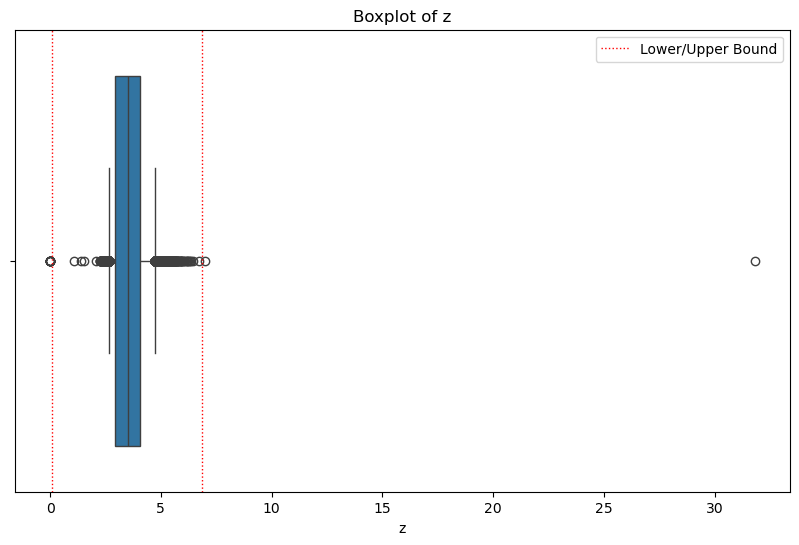

z:

- Lower Bound for Outliers: 0.08500000000000041

- Upper Bound for Outliers: 6.865

- Number of Outliers Below Lower Bound: 12

- Number of Outliers Above Upper Bound: 2

Total Number of Outlier Entries Removed in z: 12

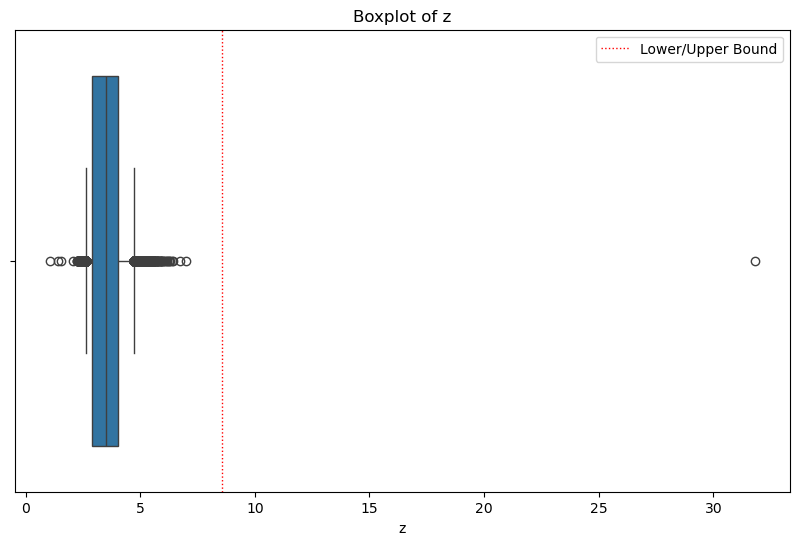

z:

- Lower Bound for Outliers: -1.6099999999999994

- Upper Bound for Outliers: 8.559999999999999

- Number of Outliers Below Lower Bound: 0

- Number of Outliers Above Upper Bound: 1

Total Number of Outlier Entries Removed in z: 1

Updated Numerical Variables Information

,carat,depth,table,price,x,y,z
count,53917.000000,53917.000000,53917.000000,53917.000000,53917.000000,53917.000000,53917.000000
mean,0.797687,61.749565,57.456939,3930.910474,5.731605,5.733428,3.539409
std,0.473777,1.432318,2.234069,3987.215003,1.119402,1.111272,0.691620
min,0.200000,43.000000,43.000000,326.000000,3.730000,3.680000,1.070000
25%,0.400000,61.000000,56.000000,949.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,62.500000,59.000000,5323.000000,6.540000,6.540000,4.040000
max,5.010000,79.000000,95.000000,18823.000000,10.740000,10.540000,6.980000


In [5]:
# Displayed to compare dataset before and after handling outliers/eronious entries
display_text("Numerical Variables Information", font_size = 20)
display_dataframe(data_df.describe(), 16) 

def visualize_outliers(df: pd.DataFrame = data_df,
                       numerical_columns_to_check: Union[list[str], str] = numerical_variables,
                       iqr_multiplier: float = 1.5,
                       remove: bool = False,
                       remove_option: str = 'both',
                       display: bool = True,) -> pd.DataFrame:
    """
    Creates a boxplot for each column of the input Dataframe in the numerical_columns_to_check parameter to help users visualize potential
    outliers in their dataset. Below this boxplot, the function prints the number of high and low outliers (determined by the IQR method) in the
    current column. The upper and lower bounds for outliers are denoted by red dotted lines. Points below the low bound red dotted line
    or above the high bound red dotted line are consideered outliers. Users can choose whether to drop outlier entries through the remove
    boolean parameter. You can change which points are considered outliers by changing the iqr_multiplier parameter.
    
    The lower and upper whiskers of the boxplot denote the 5th and 95th percentile of the current column's values respectively.

    This function can be used iteratively to handle outliers in different columns with varying sensitivity levels. It allows for
    selective removal of entries below/above the red dotted lines. The function can be run without displaying visualizations for efficiency.

    Args:
        df (pd.DataFrame): The input DataFrame containing the data to be analyzed.
        numerical_columns_to_check (Union[list[str], str], default = numerical_variables): List of the names of columns to check for outliers. The
            default argument is a list of all numerical columns in the input DataFrame.
        iqr_multiplier (float, default = 1.5): Multiplier for the IQR to define the outlier threshold. Higher values are more lenient, increasing
            the range of the upper and lower red dotted lines. Lower values are more strict, decreasing the range of the red dotted lines.
        remove (bool, default = False): If True, removes identified outliers from the DataFrame.
        remove_option (str, default = 'both'): Specifies which outliers to remove: 'both' removes all identified outliers, 'upper' only removes
            outliers greater than the upper bound (values past the upper red dotted line), and 'lower' only removes outliers less than the
            lower bound (values behind the lower red dotted line). This parameter has no effect if remove = False.
        display (bool, default = True): If True, displays boxplots for each variable. If false, only outlier statistics are printed.

    Returns:
        pd.DataFrame: The original DataFrame if remove = False, otherwise a new DataFrame with outliers removed.
    """
    # If a single column is passed in as a string, convert it to a list so the following for loop still works properly
    if type(numerical_columns_to_check) == str:
        numerical_columns_to_check = [numerical_columns_to_check]
        
    for col in numerical_columns_to_check:
        q1 = df[col].quantile(0.25)
        q3 = df[col].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - (iqr * iqr_multiplier)
        upper_bound = q3 + (iqr * iqr_multiplier)
        
        # Only create plot if display is True
        if display:
            plt.figure(figsize = (10, 6))
            ax = sns.boxplot(x = df[col], whis = [5, 95])
            plt.title(f'Boxplot of {col}')
            
            # Add vertical red dotted lines for lower and upper bounds if within the plot's x-axis limits
            x_min, x_max = ax.get_xlim()
            if x_min <= lower_bound <= x_max:
                plt.axvline(lower_bound, color='red', linestyle='dotted', linewidth=1)
            if x_min <= upper_bound <= x_max:
                plt.axvline(upper_bound, color='red', linestyle='dotted', linewidth=1)
            
            # Create legend
            legend_lines = [Line2D([0], [0], color='red', linestyle='dotted', linewidth=1)]
            legend_labels = ['Lower/Upper Bound']
            plt.legend(legend_lines, legend_labels, loc='upper right')
            plt.show()
        
        lower_outlier_count = df[col][df[col] < lower_bound].count()
        upper_outlier_count = df[col][df[col] > upper_bound].count()
        
        display_text(f"{col}:", font_size = 18, font_weight = 'bold')
        display_text(f"- Lower Bound for Outliers: {lower_bound}", font_size = 16)
        display_text(f"- Upper Bound for Outliers: {upper_bound}", font_size = 16)
        display_text(f"- Number of Outliers Below Lower Bound: {lower_outlier_count}", font_size = 16)
        display_text(f"- Number of Outliers Above Upper Bound: {upper_outlier_count}", font_size = 16)
        print()
        
    # Removes outliers from the DataFrame if remove = True
    if remove:
        # Calculate indices of outliers
        lower_outlier_indices = df.index[df[col] < lower_bound].tolist()
        upper_outlier_indices = df.index[df[col] > upper_bound].tolist()
        outlier_indices_to_be_removed = set()
        
        # Add outlier indices that will be removed to outlier_indices_to_be_removed based on the remove_option parameter
        if remove_option == "both":
            outlier_indices_to_be_removed.update(lower_outlier_indices)
            outlier_indices_to_be_removed.update(upper_outlier_indices)
        elif remove_option == "lower":
            outlier_indices_to_be_removed.update(lower_outlier_indices)
        elif remove_option == "upper":
            outlier_indices_to_be_removed.update(upper_outlier_indices)
        else:
            raise ValueError("Invalid argument passed into remove_option parameter. Please use 'both', 'lower', or 'upper'.")
            
        removed_outliers_df = df.drop(index = outlier_indices_to_be_removed)
        display_text(f"Total Number of Outlier Entries Removed in {col}: {len(outlier_indices_to_be_removed)}", font_size = 18)
        print()
        return removed_outliers_df
    
    # Simply return the original DataFrame if remove = False
    return df


"""
Use the visualize_outliers function to identify and optionally remove outliers in the numerical columns of your dataset. To effectively
handle outliers, you may need to run this function multiple times with different sensitivity levels (iqr_multiplier) for different
columns. This means you may need to run the function multiple times with different columns_to_check parameters, handling each column
individually.
"""
data_df = visualize_outliers(data_df, ["x"], iqr_multiplier = 2.5, remove = True, display = False)
data_df = visualize_outliers(data_df, ["y"], iqr_multiplier = 2.5, remove = True, display = False)
data_df = visualize_outliers(data_df, ["z"], iqr_multiplier = 2.5, remove = True, remove_option = 'lower')
data_df = visualize_outliers(data_df, ["z"], iqr_multiplier = 4, remove = True, remove_option = 'upper')

display_text("Updated Numerical Variables Information", font_size = 20)
display_dataframe(data_df.describe(), 16)

## **Setup Preprocessing**

### **Dataset Preprocessing Information**
Use the information provided by the comparison profile report to analyze the result of your data cleaning and to help determine your preprocessing steps.

In [6]:
dataset_report = ProfileReport(data_df, title = "Dataset Profiling Report (After Handling Outliers/Missing Values)", progress_bar = False, explorative = True)
post_cleaning_comparison_report = dataset_report.compare(initial_dataset_report)
post_cleaning_comparison_report

/Users/polydeltaintern/anaconda3/envs/regression-comparison-temp/lib/python3.12/site-packages/ydata_profiling/model/correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'SI2'')
  warnings.warn(


### **Preprocessing Steps**
Define your preprocessing steps in the code cell below. The provided steps address three common preprocessing transformations: scaling numerical variables, one-hot encoding nominal categorical variables, and ordianal encoding ordinal categorical variables. Customize these steps to fit the needs of your dataset. Preprocessing for your target variable and feature variables must be handled by seperate transformer variables.

The feature variable preprocessing steps will be passed into the Scikit Learn make_pipeline function when models are loaded in.

The target variable preprocessing steps will be applied directly to the y_train and y_test sets after the dataset is split.

In [6]:
"""
Input the name of the target variable column in the dataset
"""
target_column_name: str = "price"

"""
From here, you must create preprocessing steps specific  to your dataset. The following is a general preprocessing setup that can be
easily adapted to work on most datasets:
"""

"""
Input a list of the numerical features you would like to scale (defaultes to all numerical features in the dataset) and a list of
the nominal categorical features you would like to one-hot encode.
"""
numerical_features_to_scale: list[str] = list(set(numerical_variables) - set([target_column_name]))
nominal_categorical_features_to_encode: list[str] = []

"""
In the ordianl_categories_ordered_dict variable, input the order of ordinal categorical variable categories into a dictionary. The keys
of this dictionary should be names of ordinal categorical variables and the values should be lists of the categories in order from smallest
to largest.
"""
ordianl_categories_ordered_dict: dict[str, list[str]] = {
    "cut": ["Fair", "Good", "Very Good", "Premium", "Ideal"],
    "color": ["J", "I", "H", "G", "F", "E", "D"],
    "clarity": ["I1", "SI2", "SI1", "VS2", "VS1", "VVS2", "VVS1", "IF"]
}

# Extracts the keys and values of the ordianl_categories_ordered_dict into separate lists
ordianl_feature_categories_to_encode: list[str] = list(ordianl_categories_ordered_dict.keys())
ordianl_feature_categories_orders_lists: list[list[str]] = list(ordianl_categories_ordered_dict.values())

# Indicates that the first column of one-hot encoded variables should be dropped to avoid multicollinearity
onehot_drop_column: str = "first"


# The argumnet for the transformers parameter of ColumnTransformer must be a a list of touples with three entries. Each of these touples
# represents a preprocessing step. The first entry of each touple is a name for the step. The second entry is the transformer object, and
# the final entry is a list of the columns the step should be applied to.
general_feature_preprocessor = ColumnTransformer(
    transformers = [
        ('numerical_scaler', StandardScaler(), numerical_features_to_scale),
        ('nominal_encoder', OneHotEncoder(drop = onehot_drop_column), nominal_categorical_features_to_encode),
        ("ordinal_encoder", OrdinalEncoder(categories = ordianl_feature_categories_orders_lists), ordianl_feature_categories_to_encode)
    ]
)

"""
Specify the preprocessor used on the target variable column.
"""
numerical_target_preprocessor = StandardScaler()

display_text(f"Scaled Numerical Variables: {numerical_features_to_scale}")
display_text(f"Encoded Nominal Categorical Variables: {nominal_categorical_features_to_encode}")
display_text(f"Encoded Ordinal Categorical Variables (confirm that category orders were assigned to the correct ordinal categorical variable):")
if len(ordianl_feature_categories_to_encode) != 0:
    for i in range(len(ordianl_feature_categories_to_encode)):
        display_markdown(md(f"* {ordianl_feature_categories_to_encode[i]}: {ordianl_feature_categories_orders_lists[i]}"))
else:
    display_text("None")

Scaled Numerical Variables: ['table', 'carat', 'z', 'depth', 'x', 'y']

Encoded Nominal Categorical Variables: []

Encoded Ordinal Categorical Variables (confirm that category orders were assigned to the correct ordinal categorical variable):

* cut: ['Fair', 'Good', 'Very Good', 'Premium', 'Ideal']

* color: ['J', 'I', 'H', 'G', 'F', 'E', 'D']

* clarity: ['I1', 'SI2', 'SI1', 'VS2', 'VS1', 'VVS2', 'VVS1', 'IF']

## **Load Models and Set Hyperparameters**

In [7]:
"""
Configure the models you would like to compare. Assign a variable for each model to a dictionary. The key of each dictionary should be a string containing
the name of the model. The value should be another dictionary with two string keys: "model" and "param_grid". The value of the "model" key should be a
pipeline (using the scikit-learn make_pipline function) that that combines your preprocessor with the model. The value of the "param_grid" key should be
a dictionary that defines the hyperparameters to be optimized for the model. In the "param_grid" dictionary, the keys should be model hyperparmeters and
the values should be list-like objects containing values to be tested for each hyperparameter by GridSearchCV. In order for GridSearchCV to recognize the
hyperparameters of a model that is part of a pipeline, the hyperparameter keys in the "param_grid" dictionary should be prefixed with the name of the
model followed by two underscores. For example, if you want to optimize the alpha hyperparameter of a Lasso model, the key in the "param_grid" dictionary
for the alpha hyperparameter should be "lasso__alpha". The prefixed model names are the same as the scikit-learn model names in all lower case.
"""
linear_model_data = {
    'Linear': {
        'model': make_pipeline(general_feature_preprocessor, LinearRegression()),
        'param_grid': {}  
    }
}


alpha_values = np.linspace(0.01, 100, num = 100)

lasso_model_data = {
    'Lasso': {
        'model': make_pipeline(general_feature_preprocessor, Lasso()),
        'param_grid': {'lasso__alpha': alpha_values}
    }
}


ridge_model_data = {
    'Ridge': {
        'model': make_pipeline(general_feature_preprocessor, Ridge()),
        'param_grid': {'ridge__alpha': alpha_values}
    }
}


random_forest_model_data = {
    'Random Forest': {
        'model': make_pipeline(general_feature_preprocessor, RandomForestRegressor(random_state = 42)),
        'param_grid': {
            'randomforestregressor__n_estimators': [100, 200],
            'randomforestregressor__max_depth': [None, 20],
            'randomforestregressor__max_features': [1.0, "sqrt"]
        }
    }
}


svr_model_data = {
    'SVR': {
        'model': make_pipeline(general_feature_preprocessor, SVR()),
        'param_grid': {
            'svr__C': [.1, 1, 10]  
        }
    }
}


"""
Use the unpacking operator (**) to place all of your models in the models dictionary.
"""
models = {
    **linear_model_data,
    **lasso_model_data,
    **ridge_model_data,
    **random_forest_model_data,
    **svr_model_data
}    

## **Model Training and Evaluation**
Split the data into training and testing sets using the scikit-learn train_test_split function and transform the target variable using your target preprocessing steps. After this, the train_and_evaluate_models function will have access to all of it's necessary variables.

In [8]:
num_decimal_places: int = 7 # Determines the number of decimal places to display for model evaluation metrics

# Splits dataset into feature variables and target variable
X: pd.DataFrame = data_df.drop(columns = [target_column_name])
y: pd.Series = data_df[target_column_name]
num_features: int = len(X.columns)

# Users can change the argument passed into the test_size parameter to adjust the size of the testing set (currently set to 20% of the dataset)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)
feature_list: list[str] = list(X_train.columns)


"""
Apply your target preprocessor to your target variable. The exact implementation will depend on the specifics of your target preprocessor.
"""
# StandardScaler() requires a multidimensional array-like object as input, so the target series is converted into DataFrame so the preprocesser can be applied
y_train: pd.DataFrame = pd.DataFrame(y_train, columns = [target_column_name])
y_test: pd.DataFrame = pd.DataFrame(y_test, columns = [target_column_name])

# Applying the StandardScaler() fit_transform method returns a 2D numpy array
y_train: np.ndarray = numerical_target_preprocessor.fit_transform(y_train)
y_test: np.ndarray  = numerical_target_preprocessor.fit_transform(y_test)

# Must convert the target variable back to a 1D array for the models to be trained, which is done through the ravel() method
y_train: np.ndarray = y_train.ravel()
y_test: np.ndarray = y_test.ravel()


def train_and_evaluate_models(models_dictionary: dict[str, dict] = models,
                              X_train: pd.DataFrame = X_train,
                              X_test: pd.DataFrame = X_test,
                              y_train: Union[pd.Series, np.ndarray] = y_train,
                              y_test: Union[pd.Series, np.ndarray] = y_test) -> dict:
    """
    Trains and evaluates the passed in regression models using grid search for hyperparameter tuning.

    This function iterates through a dictionary of models, performs grid search cross-validation
    for hyperparameter tuning, trains each model with the best parameters, and evaluates their
    performance on both training and test sets. Information from this process is saved for each
    model in the model_results dictionary to be used later for model comparison.

    Args:
        models_dict (str, dict[str, dict]): A dictionary containing model information.
            Each key is a model name, and each value is another dictionary with 'model' and 'param_grid' keys.
            Defaults to the global 'models' variable.
        X_train (pd.DataFrame): The feature matrix for training.
            Defaults to the global 'X_train' variable.
        X_test (pd.DataFrame): The feature matrix for testing.
            Defaults to the global 'X_test' variable.
        y_train (Union[pd.Series, np.ndarray]): The target values for training.
            Defaults to the global 'y_train' variable.
        y_test (Union[pd.Series, np.ndarray]): The target values for testing.
            Defaults to the global 'y_test_preprocessed' variable.

    Returns:
        dict: A dictionary containing the results for each model. Each key is a model name,
        and each value is another dictionary with the following keys:
            * 'best_model': The trained model with the best hyperparameters.
            * 'best_params': The best hyperparameters found by grid search.
            * 'best_score': The best score achieved during grid search.
            * 'cv_results': The cross-validation results from grid search.
            * 'tune_train_time': The time taken for hyperparameter tuning and training.
            * 'y_train_predictions': Predictions on the training set.
            * 'y_test_predictions': Predictions on the test set.
            * 'train_mse': Mean Squared Error on the training set.
            * 'test_mse': Mean Squared Error on the test set.
            * 'test_mae': Mean Absolute Error on the test set.
            * 'test_r2': R-squared score on the test set.
            * 'test_adjusted_r2': Adjusted R-squared score on the test set.
            * 'intercept': The intercept of the model (for Linear, Lasso, and Ridge models only).
            * 'coefficients': The coefficients of the model (for Linear, Lasso, and Ridge models only).
    """
    model_results = {}
    
    for model_name, model_data in models_dictionary.items():
        display_text(f"Training and evaluating: {model_name}", font_size = 16, font_weight = 'bold')
        
        model = model_data['model']
        param_grid = model_data['param_grid']
        
        # Users can configure the number of splits for cross-validation by changing the n_splits parameter
        cross_validation = KFold(n_splits = 5, shuffle = True, random_state = 42)
        grid_search = GridSearchCV(model, param_grid, cv = cross_validation, scoring = 'neg_mean_squared_error')
        tune_train_start_time = time.time()
        grid_search.fit(X_train, y_train)
        tune_train_end_time = time.time()
        tune_train_time = tune_train_end_time - tune_train_start_time
        display_markdown(md(f"* Hyperparameter Tuning and Model Training Time: {tune_train_time:.2f} seconds"))
        
        best_model = grid_search.best_estimator_
        
        y_train_predictions = best_model.predict(X_train)
        y_test_predictions = best_model.predict(X_test)
        
        test_r2 = r2_score(y_test, y_test_predictions)
        train_mse = mean_squared_error(y_train, y_train_predictions)
        test_mse = mean_squared_error(y_test, y_test_predictions)
        test_mae = mean_absolute_error(y_test, y_test_predictions)
        
        num_test_entries = len(y_test)
        test_adjusted_r2 = 1 - ((1 - test_r2) * (num_test_entries - 1) / (num_test_entries - num_features - 1))
        
        display_markdown(md(f"* Test R-squared: {test_r2:.{num_decimal_places}f}"))
        display_markdown(md(f"* Train MSE: {train_mse:.{num_decimal_places}f}"))
        display_markdown(md(f"* Test MSE: {test_mse:.{num_decimal_places}f}"))
        display_markdown(md(f"* Test MAE: {test_mae:.{num_decimal_places}f}"))
        display_markdown(md(f"* Test Adjusted R^2: {test_adjusted_r2:.{num_decimal_places}f}"))
        
        model_results[model_name] = {
            'best_model': best_model,
            'best_params': grid_search.best_params_,
            'best_score': grid_search.best_score_,
            "cv_results": grid_search.cv_results_,
            "tune_train_time": tune_train_time,
            "y_train_predictions": y_train_predictions,
            'y_test_predictions': y_test_predictions,
            'train_mse': train_mse,
            'test_mse': test_mse,
            "test_mae": test_mae,
            'test_r2': test_r2,
            "test_adjusted_r2": test_adjusted_r2
        }
        
        if model_name in ['Linear', 'Lasso', 'Ridge']:
            model_results[model_name]["intercept"] = best_model[-1].intercept_
            model_results[model_name]["coefficients"] = best_model[-1].coef_
    
    return model_results


model_results = train_and_evaluate_models()

Training and evaluating: Linear

* Hyperparameter Tuning and Model Training Time: 0.30 seconds

* Test R-squared: 0.9123172

* Train MSE: 0.0930446

* Test MSE: 0.0876828

* Test MAE: 0.1971141

* Test Adjusted R^2: 0.9122439

Training and evaluating: Lasso

* Hyperparameter Tuning and Model Training Time: 21.44 seconds

* Test R-squared: 0.9070488

* Train MSE: 0.0971684

* Test MSE: 0.0929512

* Test MAE: 0.2081585

* Test Adjusted R^2: 0.9069712

Training and evaluating: Ridge

* Hyperparameter Tuning and Model Training Time: 18.78 seconds

* Test R-squared: 0.9123161

* Train MSE: 0.0930450

* Test MSE: 0.0876839

* Test MAE: 0.1971112

* Test Adjusted R^2: 0.9122429

Training and evaluating: Random Forest

* Hyperparameter Tuning and Model Training Time: 406.31 seconds

* Test R-squared: 0.9824251

* Train MSE: 0.0027359

* Test MSE: 0.0175749

* Test MAE: 0.0660838

* Test Adjusted R^2: 0.9824104

Training and evaluating: SVR

* Hyperparameter Tuning and Model Training Time: 182.57 seconds

* Test R-squared: 0.9804603

* Train MSE: 0.0203733

* Test MSE: 0.0195397

* Test MAE: 0.0817872

* Test Adjusted R^2: 0.9804440

## **Model Performance Comparison**

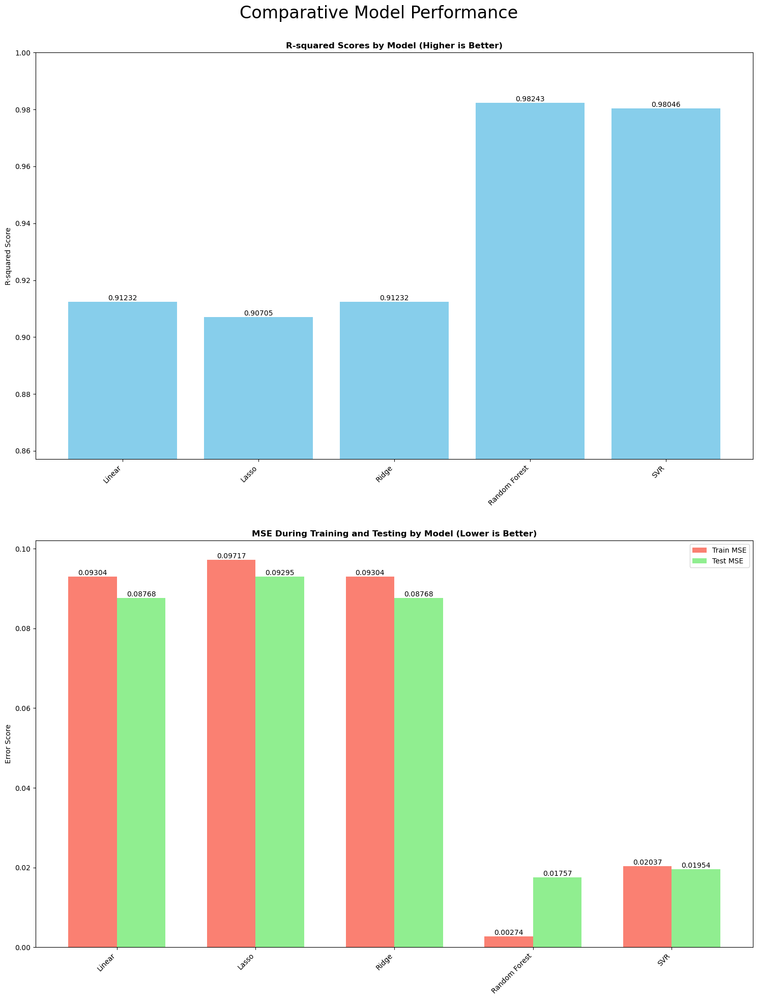

In [9]:
def plot_comparative_model_performance(model_results: dict[str, dict] = model_results) -> None:
    """
    Create a comparative visualization of model performance metrics.

    This function generates a plot with two subplots comparing the performance of multiple regression models.
    The top subplot shows R-squared scores, while the bottom subplot displays Mean Squared Error (MSE)
    for both training and testing sets.

    Args:
        model_results (dict[str, dict]): A dictionary containing performance metrics for each model.
            The outer dictionary keys are model names, and the inner dictionary contains the following keys:
            * 'test_r2': R-squared score on the test set
            * 'train_mse': Mean Squared Error on the training set
            * 'test_mse': Mean Squared Error on the test set
            Defaults to the global 'model_results' variable.

    Returns:
        None
    """
    models = list(model_results.keys())

    # Create lists of performance metrics for plotting
    r2_scores = [model_results[model]['test_r2'] for model in models]
    train_mse_scores = [model_results[model]['train_mse'] for model in models]
    test_mse_scores = [model_results[model]['test_mse'] for model in models]

    # Set up the plot
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 20))
    fig.suptitle('Comparative Model Performance', fontsize=24)

    # Plot R-squared scores
    ax1.bar(models, r2_scores, color='skyblue')
    ax1.set_ylabel('R-squared Score')
    ax1.set_title('R-squared Scores by Model (Higher is Better)', fontweight='bold')
    ax1.set_xticks(np.arange(len(models)))  # Set fixed number of ticks
    ax1.set_xticklabels(models, rotation=45, ha='right')
    
    # Adjust the y-axis to start just below the minimum R-squared score
    r2_min = min(r2_scores) - 0.05
    r2_max = min(max(r2_scores) + 0.05, 1.00)
    ax1.set_ylim([r2_min, r2_max])

    # Add value labels on the R-squared bars
    for index, score in enumerate(r2_scores):
        ax1.text(index, score, f'{score:.5f}', ha='center', va='bottom')

    # Plot MSE and MAE scores
    x = np.arange(len(models))
    width = 0.35
    ax2.bar(x - (width / 2), train_mse_scores, width, label='Train MSE', color='salmon')
    ax2.bar(x + (width / 2), test_mse_scores, width, label='Test MSE', color='lightgreen')
    ax2.set_ylabel('Error Score')
    ax2.set_title('MSE During Training and Testing by Model (Lower is Better)', fontweight='bold')
    ax2.set_xticks(x)  # Set fixed number of ticks
    ax2.set_xticklabels(models, rotation=45, ha='right')
    ax2.legend()

    # Add value labels on the MSE and MAE bars
    for index, (train_mse, test_mse) in enumerate(zip(train_mse_scores, test_mse_scores)):
        ax2.text(index - (width / 2), train_mse, f'{train_mse:.5f}', ha='center', va='bottom')
        ax2.text(index + (width / 2), test_mse, f'{test_mse:.5f}', ha='center', va='bottom')

    # Adjust layout and display the plot
    plt.tight_layout(rect = [0, 0, 1, 0.975])  # Add space at the top for the main title
    plt.subplots_adjust(hspace = 0.2)
    plt.show()


plot_comparative_model_performance()


### **Perfomance Summary**

In [10]:
def summarize_results(results: dict = model_results) -> str:
    """
    This function creates a summary DataFrame of model performance metrics,
    displays it in a formatted table, and identifies the best performing model
    based on the R-squared score
    
    Args:
        results (dict): A dictionary containing performance metrics for each model.
            The keys are model names, and the values are dictionaries containing:
            * 'test_r2': R-squared score on the test set
            * 'train_mse': Mean Squared Error on the training set
            * 'test_mse': Mean Squared Error on the test set
            * 'test_mae': Mean Absolute Error on the test set
            * 'test_adjusted_r2': Adjusted R-squared score on the test set
            Defaults to the global 'model_results' variable.
    Returns:
        best_performing_model_name (str): The name of the best performing model based on the highest R-squared score.
    """ 
    summary_df = pd.DataFrame({
        'Model': results.keys(),
        'Test R-squared': [result['test_r2'] for result in results.values()],
        "Train MSE": [result['train_mse'] for result in results.values()],
        'Test MSE': [result['test_mse'] for result in results.values()],
        'Test MAE': [result['test_mae'] for result in results.values()],
        'Test Adjusted R-squared': [result['test_adjusted_r2'] for result in results.values()]
    })

    display_text("Model Performance Summary", font_size = 20, font_weight = "bold")
    
    display_dataframe(summary_df)
    print()

    best_performing_model_name = summary_df.loc[summary_df['Test R-squared'].idxmax(), 'Model']
    display_markdown(md(f"### **Best Performing Model: {best_performing_model_name}** (based on R-squared score, the higher the better)"))
    display_markdown(md(f"* #### R-squared Score: {results[best_performing_model_name]['test_r2']}"))

    return best_performing_model_name


best_model_name = summarize_results()
best_model = model_results[best_model_name]['best_model']

Model Performance Summary

,Model,Test R-squared,Train MSE,Test MSE,Test MAE,Test Adjusted R-squared
0,Linear,0.912317,0.093045,0.087683,0.197114,0.912244
1,Lasso,0.907049,0.097168,0.092951,0.208159,0.906971
2,Ridge,0.912316,0.093045,0.087684,0.197111,0.912243
3,Random Forest,0.982425,0.002736,0.017575,0.066084,0.982410
4,SVR,0.980460,0.020373,0.019540,0.081787,0.980444


### **Best Performing Model: Random Forest** (based on R-squared score, the higher the better)

* #### R-squared Score: 0.9824250733067879

### **Comparative Plots**

In [11]:
def plot_residuals_histograms_comparison(model_results: dict[str, dict], y_test: np.ndarray) -> None:
    """
    Plot histograms of residuals for multiple models vertically.
    
    Args:
        model_results (dict[str, dict]): Dictionary of model results, where each key is a model name
        and each value is a dictionary containing model predictions
        y_test (np.ndarray): Actual target values
    Returns:
        None
    """
    num_models = len(model_results)
    num_rows = math.ceil(num_models / 2)
    fig, axes = plt.subplots(num_rows, 2, figsize=(20, 7*num_rows))
    
    fig.suptitle('Comparison of Residuals Distributions', fontsize=24, y=1.02)
    
    axes_flat = axes.flatten() if num_models > 1 else [axes]
    
    # Determine global x-axis limits
    all_residuals = []
    for results in model_results.values():
        all_residuals.extend(y_test - results['y_test_predictions'])
    global_xlim = np.percentile(all_residuals, [1, 99])
    
    error_stats = {}
    for ax, (model_name, results) in zip(axes_flat, model_results.items()):
        y_pred = results['y_test_predictions']
        residuals = y_test - y_pred
        
        # Plot histogram and KDE
        sns.histplot(residuals, kde=True, ax=ax, color='skyblue', edgecolor='black', alpha=0.7)
        
        ax.set_title(f'{model_name} Residuals', fontsize=18, fontweight='bold', pad=20)
        ax.set_xlabel('Residuals (Actual - Predicted)', fontsize=14)
        ax.set_ylabel('Density', fontsize=14)
        ax.tick_params(axis='both', which='major', labelsize=12)
        
        ax.axvline(x=0, color='r', linestyle='--', linewidth=2, label='Perfect Prediction')
        ax.set_xlim(global_xlim)
        
        # Calculate and display statistics
        mean_residual = np.mean(residuals)
        median_residual = np.median(residuals)
        std_residual = np.std(residuals)
        
        stats_text = (f'Mean: {mean_residual:.3f}\n'
                      f'Median: {median_residual:.3f}\n'
                      f'Std Dev: {std_residual:.3f}')
        
        ax.text(0.95, 0.95, stats_text, transform=ax.transAxes, 
                verticalalignment='top', horizontalalignment='right',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),
                fontsize=12)
        
        ax.grid(True, linestyle=':', alpha=0.6)
        ax.legend(loc='upper left')
        
        # Calculate and save statistics for percentage errors
        percentage_errors = (residuals / y_test) * 100
        mean_error = np.mean(percentage_errors)
        median_error = np.median(percentage_errors)
        std_error = np.std(percentage_errors)

        error_stats[model_name] = {
            'mean_error': mean_error,
            'median_error': median_error,
            'std_error': std_error
        }
    
    for ax in axes_flat[num_models:]:
        ax.set_visible(False)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.96, hspace=0.3, wspace=0.2)
    plt.show()
    return error_stats


def plot_residuals_scatter_comparison(model_results: dict[str, dict], y_test: np.ndarray) -> None:
    """
    This function generates a grid of scatter plots, one for each model in the input dictionary.
    Each plot visualizes the relationship between predicted values and their residuals,
    helping users better understand model performance and compare different models.

    Args:
        model_results (dict[str, dict]): A dictionary where each key is a model name and each value
            is another dictionary containing at least the key 'y_test_predictions', a numpy array
            of model predictions
        y_test (np.ndarray): Array of actual target values from the test set
    """
    num_models = len(model_results)
    num_rows = math.ceil(num_models / 2)
    fig, axes = plt.subplots(num_rows, 2, figsize=(22, 9*num_rows))  # Increased width for colorbars
    
    fig.suptitle('Comparison of Residuals Scatter Plots', fontsize=24, y=1.02)
    
    axes_flat = axes.flatten() if num_models > 1 else [axes]
    
    # Determine global axis limits and density range
    all_predicted = []
    all_residuals = []
    all_densities = []
    for results in model_results.values():
        y_pred = results['y_test_predictions']
        residuals = y_test - y_pred
        all_predicted.extend(y_pred)
        all_residuals.extend(residuals)
        xy = np.vstack([y_pred, residuals])
        all_densities.extend(stats.gaussian_kde(xy)(xy))
    
    global_xlim = np.percentile(all_predicted, [1, 99])
    global_ylim = np.percentile(all_residuals, [1, 99])
    vmin, vmax = np.percentile(all_densities, [5, 95])  # For consistent colorbar scale
    
    for ax, (model_name, results) in zip(axes_flat, model_results.items()):
        y_pred = results['y_test_predictions']
        residuals = y_test - y_pred
        
        # Create scatter plot with density coloring
        xy = np.vstack([y_pred, residuals])
        density = stats.gaussian_kde(xy)(xy)
        
        idx = density.argsort()
        x, y, z = y_pred[idx], residuals[idx], density[idx]
        
        scatter = ax.scatter(x, y, c=z, cmap='viridis', alpha=0.7, vmin=vmin, vmax=vmax)
        
        # Add trend line
        z = np.polyfit(y_pred, residuals, 1)
        p = np.poly1d(z)
        ax.plot(y_pred, p(y_pred), "black", alpha=0.8, label='Trend') 
        
        ax.axhline(y=0, color='red', linestyle='--', linewidth=2, label='Perfect Prediction')  
        ax.set_xlim(global_xlim)
        ax.set_ylim(global_ylim)
        
        ax.set_title(f'{model_name} Residuals', fontsize=18, fontweight='bold', pad=20)
        ax.set_xlabel('Predicted Values', fontsize=14)
        ax.set_ylabel('Residuals', fontsize=14)
        ax.tick_params(axis='both', which='major', labelsize=12)
        
        ax.grid(True, linestyle=':', alpha=0.6)
        ax.legend(loc='lower right')
        
        # Add individual colorbar
        cbar = plt.colorbar(scatter, ax=ax, pad=0.02)
        cbar.set_label('Density', fontsize=12)
        cbar.ax.tick_params(labelsize=10)
    
    for ax in axes_flat[num_models:]:
        ax.set_visible(False)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.97, hspace=0.2, wspace=0.1)
    
    plt.show()


def plot_actual_vs_predicted_comparison(model_results: dict[str, dict], y_test: np.ndarray, target_name: str = "Target") -> None:
    """
    Plots enhanced actual vs predicted values comparison for multiple regression models with improved range.
    
    Args:
    model_results (dict[str, dict]): Dictionary of model results, where each key is a model name
                                     and each value is a dictionary containing model predictions.
    y_test (np.ndarray): Actual target values.
    target_name (str): Name of the target variable for axis labels.
    
    Returns:
    None
    """
    num_models = len(model_results)
    num_rows = math.ceil(num_models / 2)
    fig, axes = plt.subplots(num_rows, 2, figsize=(20, 10*num_rows))
    fig.suptitle(f'Comparison of Actual vs Predicted {target_name} Values', fontsize=26, y=1.02)
    
    # Flatten axes array for easy iteration
    axes_flat = axes.flatten() if num_models > 2 else ([axes] if num_models == 1 else axes)
    
    # Calculate global min and max for consistent scaling
    all_y = np.concatenate([y_test] + [results['y_test_predictions'] for results in model_results.values()])
    global_min, global_max = np.min(all_y), np.max(all_y)
    
    # Calculate the range and add a buffer (e.g., 10% of the range on each side)
    data_range = global_max - global_min
    buffer = 0.1 * data_range
    plot_min = global_min - buffer
    plot_max = global_max + buffer
    
    # Ensure the aspect ratio is equal and adjust the limits if necessary
    center = (plot_min + plot_max) / 2
    half_range = max(plot_max - center, center - plot_min)
    plot_min = center - half_range
    plot_max = center + half_range
    
    # Calculate global min and max errors
    all_errors = np.concatenate([np.abs(y_test - results['y_test_predictions']) for results in model_results.values()])
    vmin, vmax = np.min(all_errors), np.max(all_errors)
    
    for ax, (model_name, results) in zip(axes_flat, model_results.items()):
        y_pred = results['y_test_predictions']
        errors = np.abs(y_test - y_pred)
        
        # Set background color to white and add grid
        ax.set_facecolor('white')
        ax.grid(True, linestyle=':', alpha=0.5, color='gray')
        
        # Create scatter plot with smaller, more transparent points
        scatter = ax.scatter(y_test, y_pred, c=errors, cmap='viridis', alpha=0.7, s=20, vmin=vmin, vmax=vmax)
        
        # Add diagonal line for perfect predictions
        ax.plot([plot_min, plot_max], [plot_min, plot_max], 'r--', linewidth=2, label='Perfect Prediction')
        
        # Set consistent scale with balanced range
        ax.set_xlim(plot_min, plot_max)
        ax.set_ylim(plot_min, plot_max)
        
        # Adjust title and labels
        ax.set_title(model_name, fontsize=20, fontweight='bold', pad=20)
        ax.set_ylabel(f'Predicted {target_name}', fontsize=14)
        ax.set_xlabel(f'Actual {target_name}', fontsize=14)
        ax.tick_params(axis='both', which='major', labelsize=12)
        
        # Add legend for perfect prediction line
        ax.legend(fontsize=10, loc='lower right')
        
        # Add colorbar for each subplot
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.1)
        cbar = plt.colorbar(scatter, cax=cax)
        cbar.set_label('Absolute Prediction Error Gradient', fontsize=12)
    
    # Hide any unused subplots
    for ax in axes_flat[num_models:]:
        ax.set_visible(False)
    
    plt.tight_layout()
    plt.subplots_adjust(top = .97, hspace=0.2, wspace=0.25)
    plt.show()


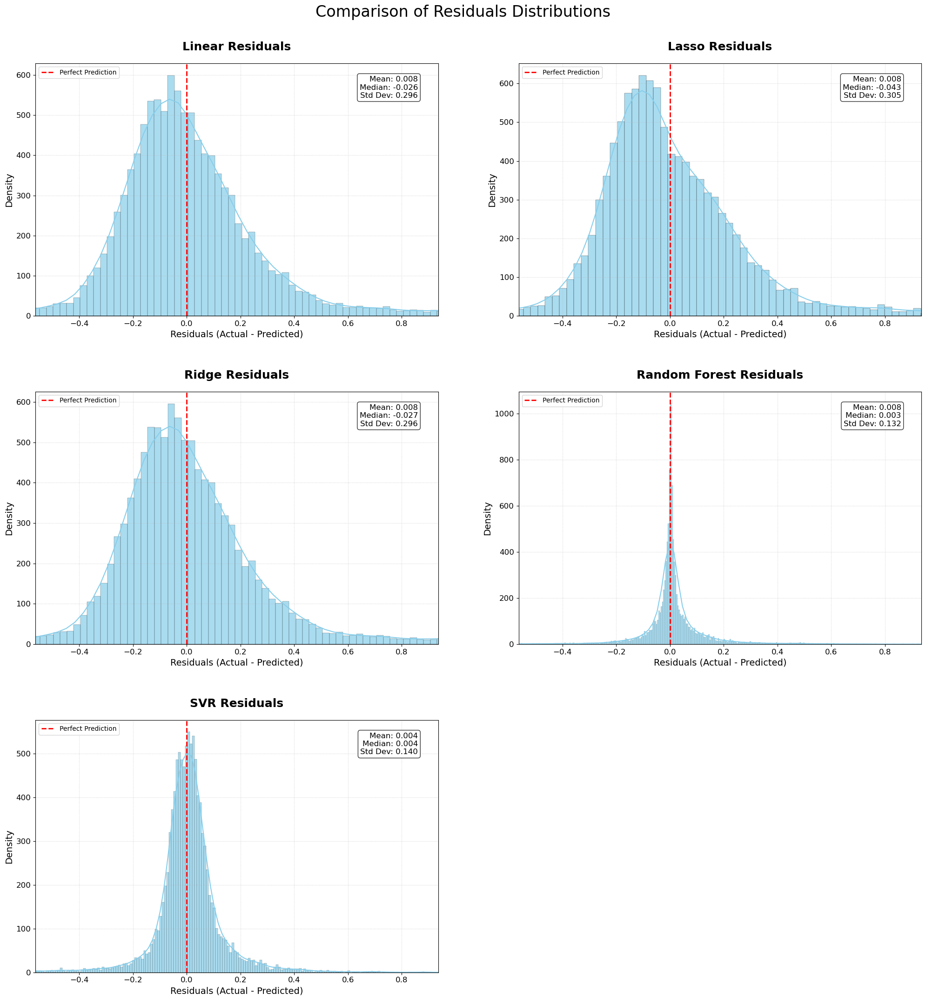

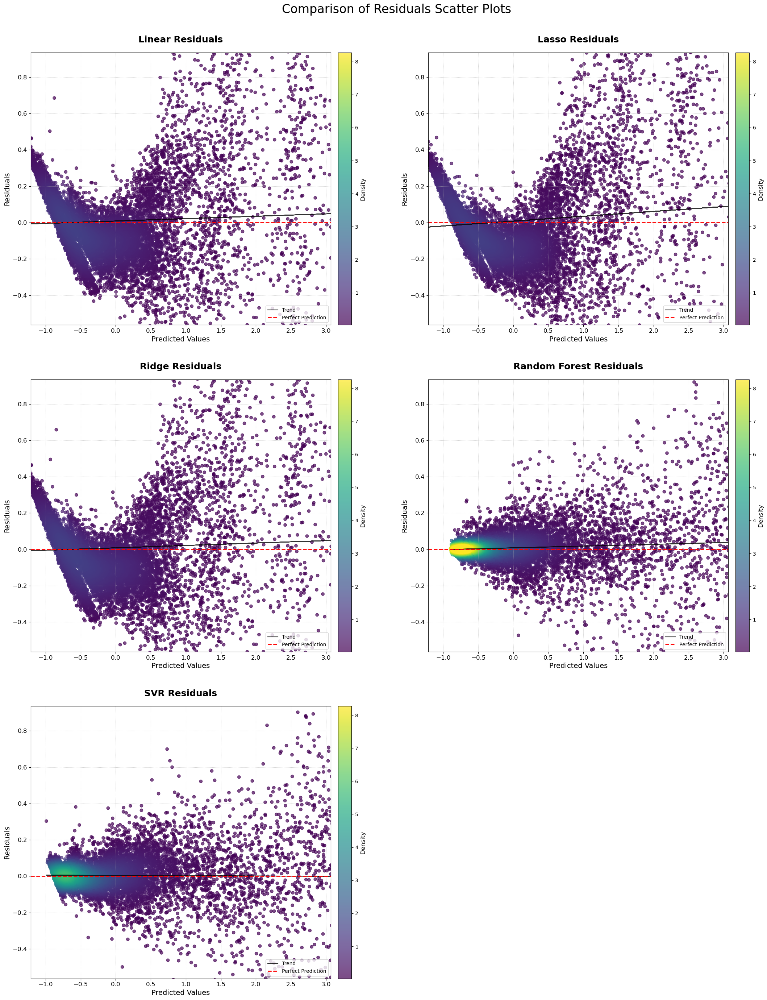

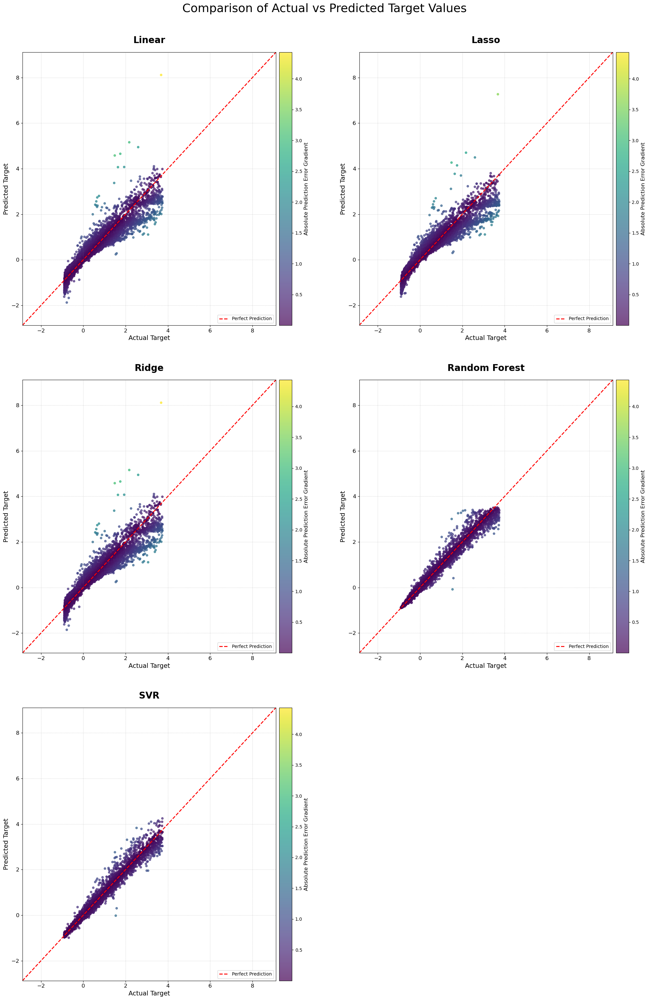

In [12]:
plot_residuals_histograms_comparison(model_results, y_test)
plot_residuals_scatter_comparison(model_results, y_test)
plot_actual_vs_predicted_comparison(model_results, y_test)

### **Functions for Displaying Individual Model Perfomance Visuals**

In [34]:
def create_fit_function_equation_markdown(intercept: int, coefficient_list: list, feature_list: list = feature_list, num_decimal_places: int = num_decimal_places) -> str:
    model_equation = f"### {num_decimal_places} = {intercept:.{num_decimal_places}f}"
    
    for i in range(len(coefficient_list)):
        model_equation += f" + {coefficient_list[i]:.{num_decimal_places}f}({feature_list[i]})"
        
    return model_equation

def display_model_evaluation_results(model_name: str, results: dict = model_results) -> None:
    """
    Displays the evaluation results for a given model.
    
    Args:
        model_name (str): Name of the model
        results (dict): Dictionary containing the evalutation results of each model
    Returns: None
    """
    display_markdown(md(f"### **Model: {model_name}**"))
    display_markdown(md(f"* #### **Train MSE:** {results[model_name]["train_mse"]:.{num_decimal_places}f}"))
    display_markdown(md(f"* #### **Test MSE:** {results[model_name]["test_mse"]:.{num_decimal_places}f}"))
    display_markdown(md(f"* #### **Test MAE:** {results[model_name]["test_mae"]:.{num_decimal_places}f}"))
    display_markdown(md(f"* #### **Test R^2:** {results[model_name]["test_r2"]:.{num_decimal_places}f}"))
    display_markdown(md(f"* #### **Test Adjusted R^2:** {results[model_name]["test_adjusted_r2"]:.{num_decimal_places}f}"))
    
    if model_name in ['Linear', 'Lasso', 'Ridge']:
        display_markdown(md(f"### **Model Equation:**"))
        display_markdown(md(create_fit_function_equation_markdown(results[model_name]["intercept"], results[model_name]["coefficients"])))
        
    
def plot_residuals_histogram(model_name: str, residuals: np.ndarray) -> None:
    """
    Display a histogram of residuals with KDE and statistics.
    
    Args:
        residuals (np.ndarray): Residuals (actual - predicted)
        model_name (str): Name of the model
    Returns:
        None
    """
    plt.figure(figsize=(12, 6))
    sns.histplot(residuals, kde=True, color='skyblue', edgecolor='black', alpha=0.7)
    plt.xlabel('Residuals (Actual - Predicted)')
    plt.ylabel('Density')
    plt.title(f'Histogram of Residuals ({model_name})')
    plt.grid(True)
    
    mean_residual = np.mean(residuals)
    median_residual = np.median(residuals)
    std_residual = np.std(residuals)

    stats_text = (f'Mean: {mean_residual:.3f}\n'
                  f'Median: {median_residual:.3f}\n'
                  f'Std Dev: {std_residual:.3f}\n')
    
    plt.text(0.95, 0.95, stats_text, transform=plt.gca().transAxes, 
             verticalalignment='top', horizontalalignment='right',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),
             fontsize=12)
    
    plt.axvline(x=0, color='red', linestyle='--', linewidth=2, label='Perfect Prediction')
    plt.legend()
    plt.show()


def plot_residuals_scatter(model_name: str, y_pred: np.ndarray, residuals: np.ndarray) -> None:
    """
    Displays a scatter plot of residuals vs predicted values with density coloring.
    
    Args:
        y_pred (np.ndarray): Predicted target values
        residuals (np.ndarray): Residuals (actual - predicted)
        model_name (str): Name of the model
    Returns:
        None
    """
    plt.figure(figsize=(12, 6))
    
    # Calculate density for coloring
    xy = np.vstack([y_pred, residuals])
    density = stats.gaussian_kde(xy)(xy)
    
    idx = density.argsort()
    x, y, z = y_pred[idx], residuals[idx], density[idx]
    
    scatter = plt.scatter(x, y, c=z, cmap='viridis', alpha=0.7)
    
    # Add trend line
    z = np.polyfit(y_pred, residuals, 1)
    p = np.poly1d(z)
    plt.plot(y_pred, p(y_pred), "black", alpha=0.8, label='Trend')

    plt.axhline(y=0, color='red', linestyle='--', linewidth=2, label='Perfect Prediction')
    plt.xlabel('Predicted Target Values')
    plt.ylabel('Residuals (Actual - Predicted)')
    plt.title(f'Residual Plot ({model_name})')
    plt.grid(True)
    plt.legend()
    
    # Add colorbar
    cbar = plt.colorbar(scatter)
    cbar.set_label('Density', fontsize=12)
    cbar.ax.tick_params(labelsize=10)
    
    plt.show()


def plot_actual_vs_predicted(model_name: str, y_test: np.ndarray, y_pred: np.ndarray, target_name: str = "Target") -> None:
    """
    Displays a plot of actual vs predicted values with error gradient.
    
    Args:
        y_test (np.ndarray): Actual target values
        y_pred (np.ndarray): Predicted target values
        model_name (str): Name of the model
        target_name (str): Name of the target variable for axis labels
    Returns:
        None
    """
    errors = np.abs(y_test - y_pred)
    plt.figure(figsize=(13, 6))
    scatter = plt.scatter(y_test, y_pred, c=errors, cmap='viridis', alpha=0.7)
    plt.colorbar(scatter, label='Absolute Error')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label='Perfect Prediction')
    plt.xlabel(f'Actual {target_name}')
    plt.ylabel(f'Predicted {target_name}')
    plt.title(f'Actual vs. Predicted with Error Gradient ({model_name})')
    plt.grid(True)

    # Move legend to the bottom right
    plt.legend(loc='lower right')
    
    plt.show()

## **Individual Model Evaluation and Performance Visualizations**
Use this section to get a better view of the plots for models you are interested in. The code for each model produces the above comparison plots on an individualized scale.

### **Linear Model**

### **Model: Linear**

* #### **Train MSE:** 0.0930446

* #### **Test MSE:** 0.0876828

* #### **Test MAE:** 0.1971141

* #### **Test R^2:** 0.9123172

* #### **Test Adjusted R^2:** 0.9122439

### **Model Equation:**

### 7 = -0.7481215 + -0.5334796(carat) + 0.6549459(cut) + -0.0096926(color) + 1.2945729(clarity) + -0.3827423(depth) + 0.0207128(table) + 0.0326772(x) + 0.0808619(y) + 0.1238857(z)

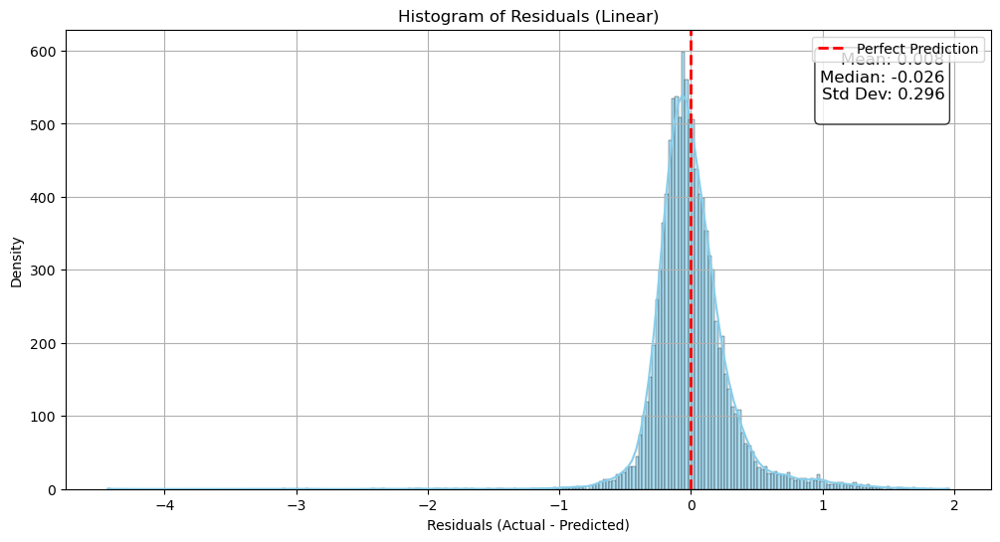

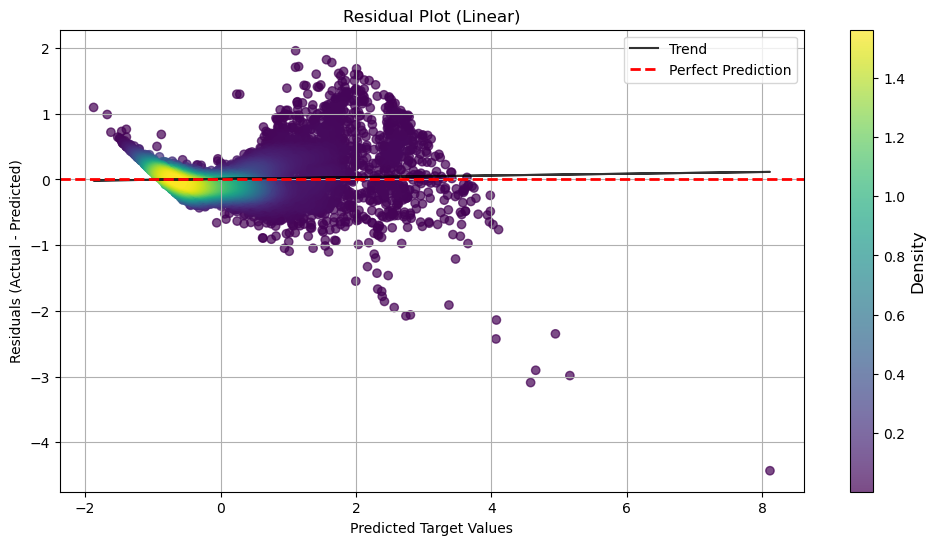

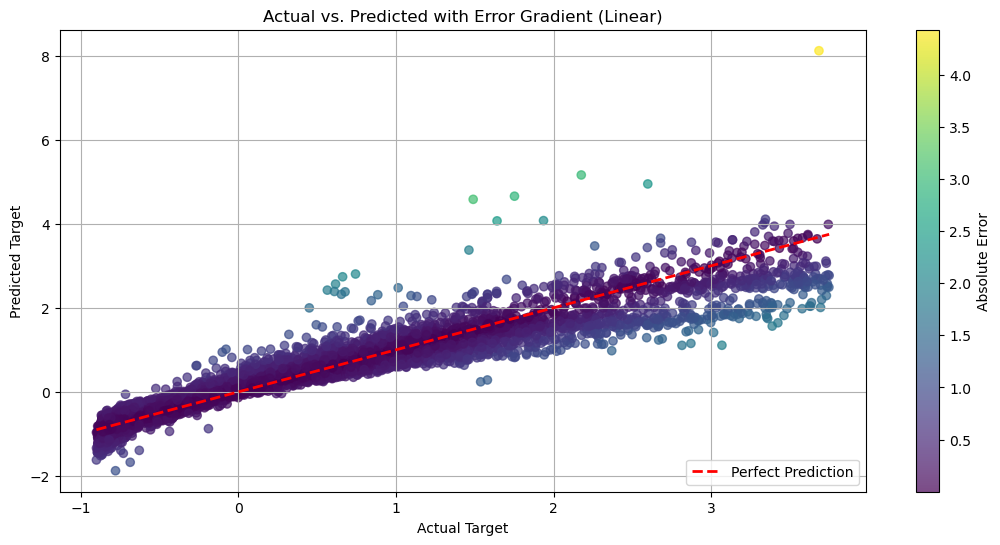

In [35]:
linear_model_name: str = "Linear"

linear_y_train_predictions = model_results[linear_model_name]["y_train_predictions"]
linear_y_test_predictions = model_results[linear_model_name]["y_test_predictions"]
linear_residuals = y_test - linear_y_test_predictions


display_model_evaluation_results(linear_model_name)
plot_residuals_histogram(linear_model_name, linear_residuals)
plot_residuals_scatter(linear_model_name, linear_y_test_predictions, linear_residuals)
plot_actual_vs_predicted(linear_model_name, y_test, linear_y_test_predictions)


### **Lasso Model**

In [ ]:
lasso_model_name: str = "Lasso"

lasso_y_train_predictions = model_results[lasso_model_name]["y_train_predictions"]
lasso_y_test_predictions = model_results[lasso_model_name]["y_test_predictions"]
lasso_residuals = y_test - lasso_y_test_predictions


display_model_evaluation_results(lasso_model_name)
plot_residuals_histogram(lasso_model_name, lasso_residuals)
plot_residuals_scatter(lasso_model_name, lasso_y_test_predictions, lasso_residuals)
plot_actual_vs_predicted(lasso_model_name, y_test, lasso_y_test_predictions)

### **Ridge Model**

In [ ]:
ridge_model_name: str = "Ridge"

ridge_y_train_predictions = model_results[ridge_model_name]["y_train_predictions"]
ridge_y_test_predictions = model_results[ridge_model_name]["y_test_predictions"]
ridge_residuals = y_test - ridge_y_test_predictions


display_model_evaluation_results(ridge_model_name)
plot_residuals_histogram(ridge_model_name, ridge_residuals)
plot_residuals_scatter(ridge_model_name, ridge_y_test_predictions, ridge_residuals)
plot_actual_vs_predicted(ridge_model_name, y_test, ridge_y_test_predictions)

### **Random Forest Model**

### **Model: Random Forest**

* #### **Train MSE:** 0.0027355

* #### **Test MSE:** 0.0175612

* #### **Test MAE:** 0.0660846

* #### **Test R^2:** 0.9824388

* #### **Test Adjusted R^2:** 0.9824241

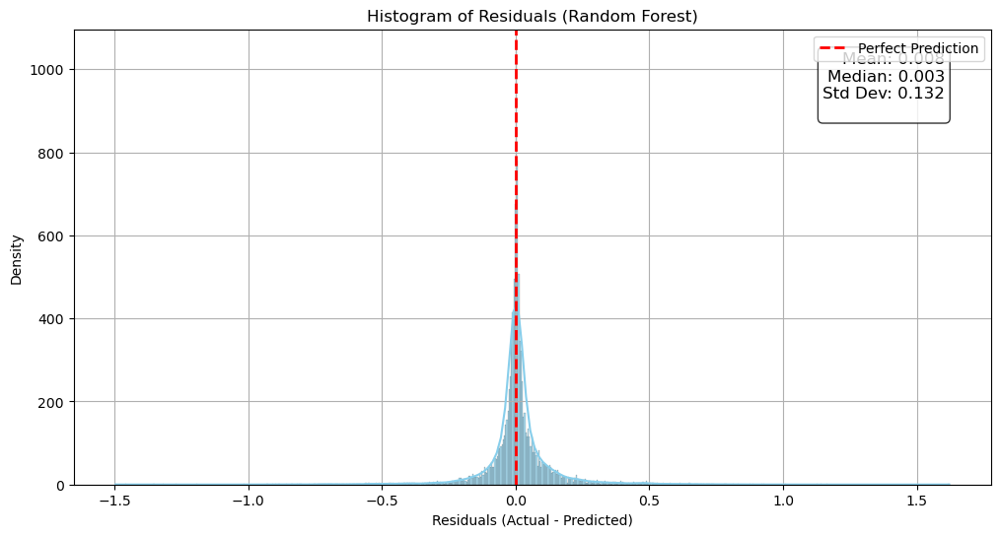

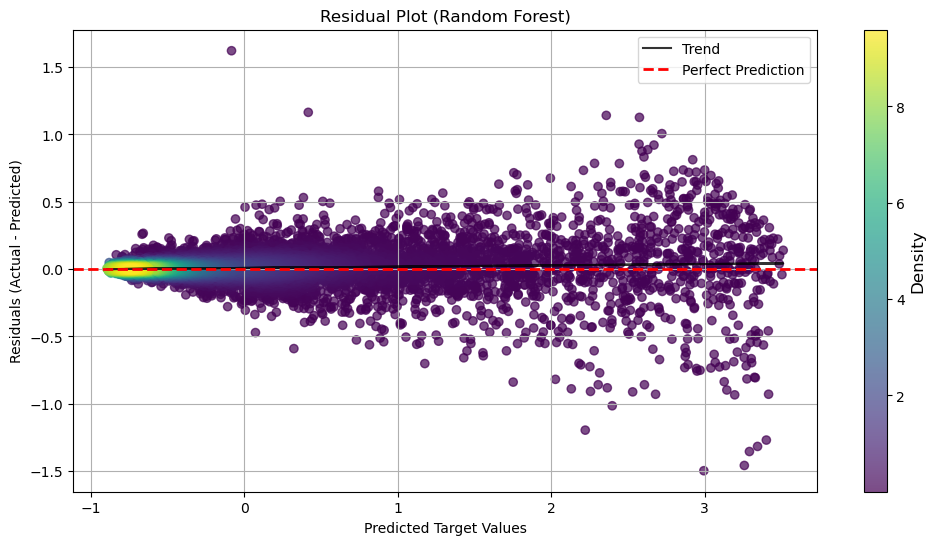

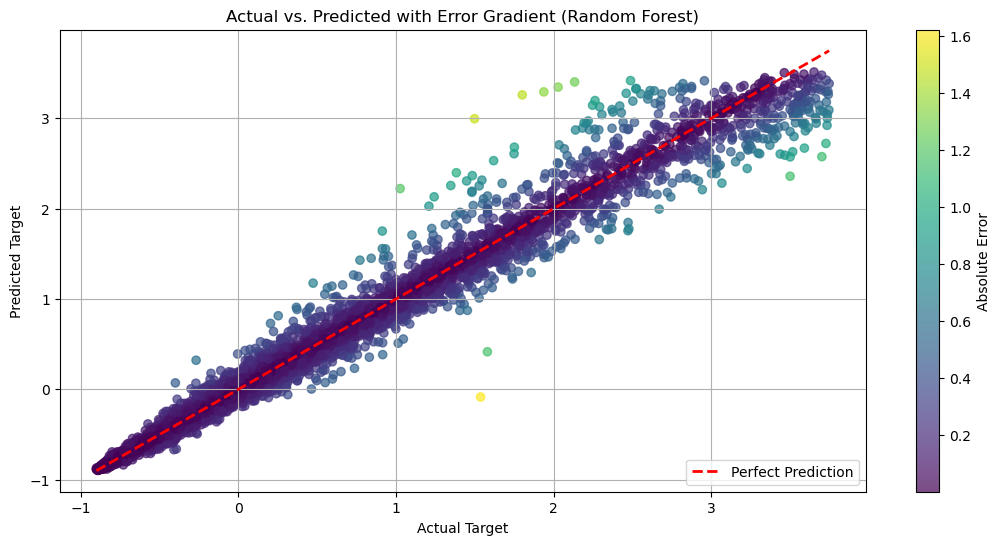

In [36]:
random_forest_model_name: str = "Random Forest"

random_forest_y_train_predictions = model_results[random_forest_model_name]["y_train_predictions"]
random_forest_y_test_predictions = model_results[random_forest_model_name]["y_test_predictions"]
random_forest_residuals = y_test - random_forest_y_test_predictions


display_model_evaluation_results(random_forest_model_name)
plot_residuals_histogram(random_forest_model_name, random_forest_residuals)
plot_residuals_scatter(random_forest_model_name, random_forest_y_test_predictions, random_forest_residuals)
plot_actual_vs_predicted(random_forest_model_name, y_test, random_forest_y_test_predictions)

### **Support Vector Model**

### **Model: SVR**

* #### **Train MSE:** 0.0203734

* #### **Test MSE:** 0.0195386

* #### **Test MAE:** 0.0817765

* #### **Test R^2:** 0.9804614

* #### **Test Adjusted R^2:** 0.9804451

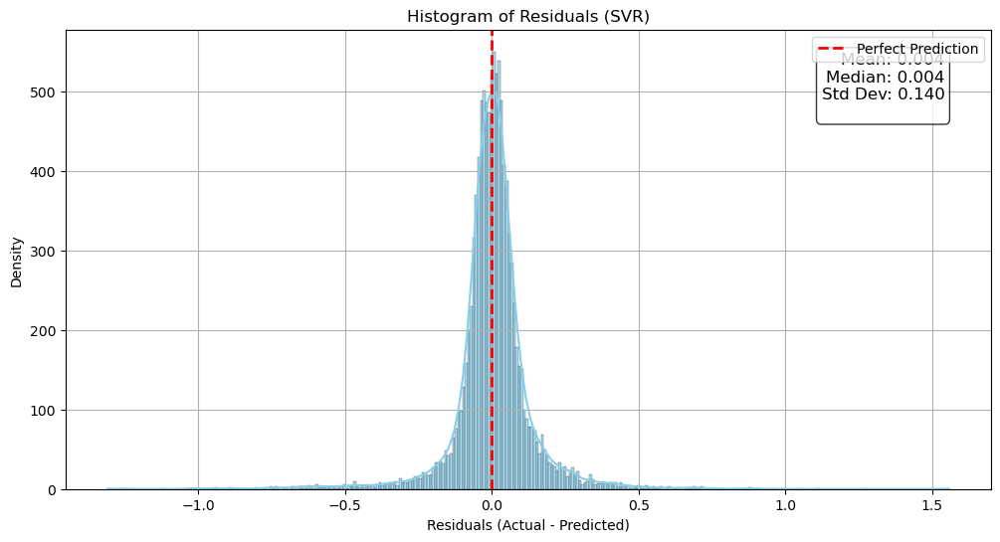

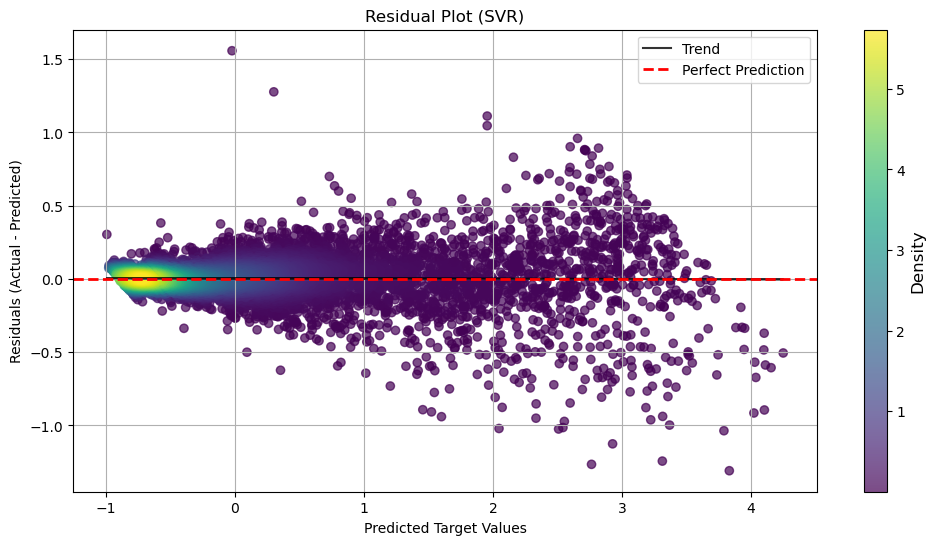

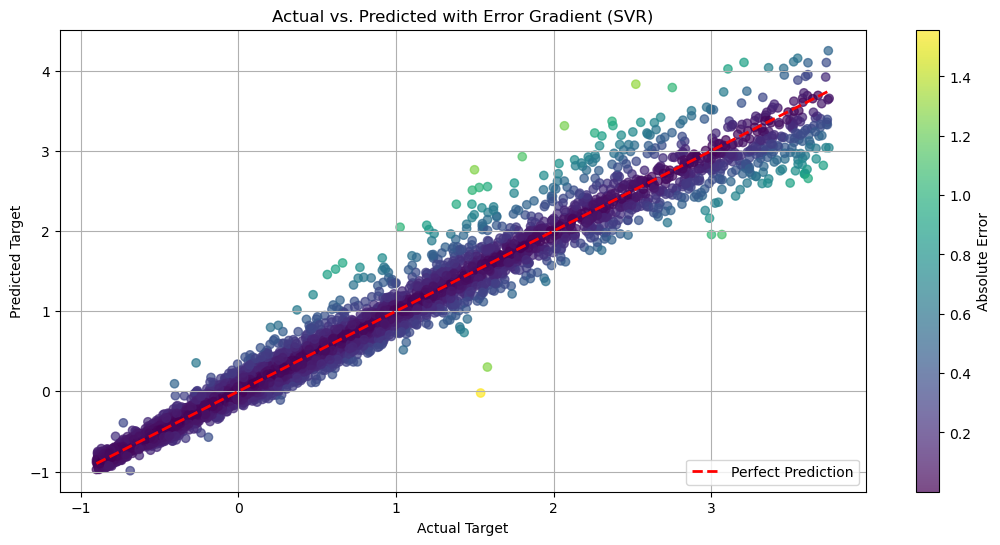

In [37]:
svr_model_name: str = "SVR"

svr_y_train_predictions = model_results[svr_model_name]["y_train_predictions"]
svr_y_test_predictions = model_results[svr_model_name]["y_test_predictions"]
svr_residuals = y_test - svr_y_test_predictions

display_model_evaluation_results(svr_model_name)
plot_residuals_histogram(svr_model_name, svr_residuals)
plot_residuals_scatter(svr_model_name, svr_y_test_predictions, svr_residuals)
plot_actual_vs_predicted(svr_model_name, y_test, svr_y_test_predictions)

## **Save Best Model**

In [ ]:
"""
Configure the name of the file to save the model to and chosose a method for saving the file (as a joblib or pickle file).
"""
save_file_name: str = "diamond_price_regression_model.pkl"

def save_model_pickle(file_name: str = save_file_name, model_name: str = best_model, results: dict[str, dict] = model_results) -> None:
    """
    Saves the best performing model to a pickle file.
    
    Args:
        file_name (str): Name of the pickle file to save the model to
        model_name (str): Name of the model that is about to be saved
        results (dict[str, dict]): Dictionary containing the model object, predictions on the testing data, and other model perfomance data
    Returns:
        None
    """
    with open(file_name, 'wb') as file:
        pickle.dump(results[model_name], file)
        

def save_model_joblib(file_name: str, model_name: str = best_model, results: dict[str, dict] = model_results) -> None:
    """
    Saves the best performing model to a joblib file.
    
    Args:
        file_name (str): Name of the joblib file to save the model to
        model_name (str): Name of the model that is about to be saved
        results (dict[str, dict]): Dictionary containing the model object, predictions on the testing data, and other model perfomance data
    Returns:
        None
    """
    dump(results[model_name], file_name)